In [1]:
import numpy as np 
import rasterio as rio
import matplotlib.pyplot as plt
from style import set_style 


def read_tif(file_path, band_indices):
    """
    Reads specified bands from a TIFF file.

    Parameters:
    - file_path (str): Path to the .tif file.
    - band_indices (list of int): Indices of the bands to read.

    Returns:
    - dict: A dictionary where keys are band indices and values are the corresponding band data.
    """
    data = {}
    with rio.open(file_path) as src:
        crs = src.crs
        transform = src.transform
        
        for index in band_indices:
            data[index] = src.read(index)
    return data


def radiometric_spike_noise(array, severity=1.0):
    """
    Randomly amplifies or reduces the values in each column of a 2D or 3D array.

    This function iterates through each channel (2D slice) of the input array and modifies 
    its columns by applying a random amplification or reduction factor. The degree of 
    amplification or reduction is controlled by the `severity` parameter.

    Parameters:
    ----------
    array : numpy.ndarray
        A 2D or 3D numpy array. If the array is 3D, the first dimension is considered as 
        the channel dimension.
    severity : float, optional
        A positive float that controls the severity of the amplification/reduction. 
        A higher value will result in a greater range of possible changes. Default is 1.0.

    Returns:
    -------
    numpy.ndarray
        The modified array with amplified or reduced column values.
    """
    # Ensure severity is positive
    if severity <= 0:
        raise ValueError("Severity must be a positive number.")
    
    # If the input is 2D, convert it to 3D with a single channel
    if array.ndim == 2:
        array = np.expand_dims(array, axis=0)
    
    # Apply random amplification/reduction to each channel and column
    for channel in range(array.shape[0]):
        for col in range(array.shape[2]):
            # Generate a random factor for amplification/reduction
            factor = 1 + (np.random.rand() * severity * np.random.choice([-1, 1]))
            # Apply the factor to the column
            array[channel, :, col] *= factor
    
    # If the input was originally 2D, return to 2D
    if array.shape[0] == 1:
        return np.squeeze(array, axis=0)
    
    return array

bs = '/Data_large/marine/Datasets/VENuS/ds_L0/perfect'
im='ASH_L0_07848_20190125_MultiLayer_mask_OK.tif'


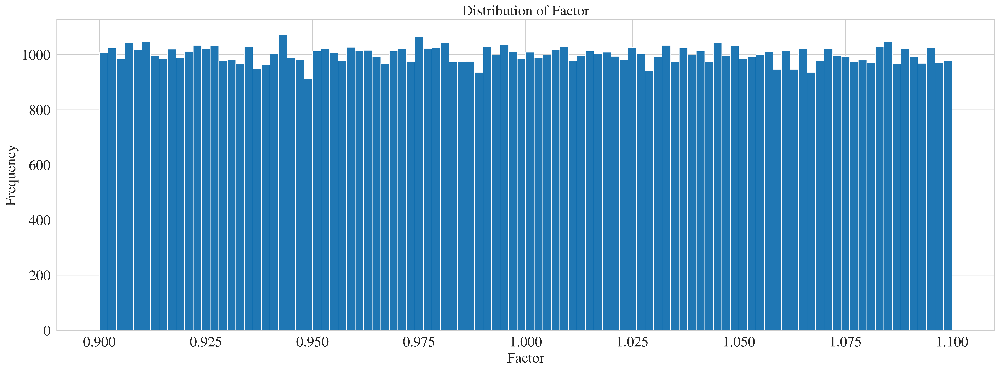

In [2]:
severity = 0.1

factor = 1 + (np.random.rand() * severity * np.random.choice([-1, 1]))

def get_f():
    return 1 + (np.random.rand() * severity * np.random.choice([-1, 1]))


plt.hist([get_f() for _ in range(100000)], bins=100)
plt.xlabel('Factor')
plt.ylabel('Frequency')
plt.title('Distribution of Factor')
plt.show()


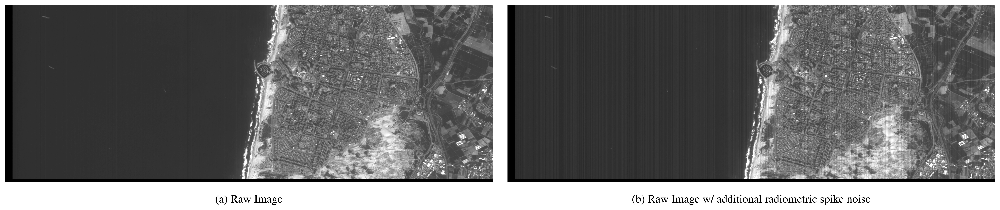

In [3]:
severity = 0.1

plt.figure(figsize=(20, 20))
plt.subplot(1, 2, 1)
img = read_tif(f'{bs}/{im}', [6])
plt.imshow(img[6][1700:], cmap='gray', vmin=0, vmax=235)
plt.grid(False)
plt.axis(False)
# Adjust the placement of the text
plt.text(0.5, -0.1, '(a) Raw Image', 
         fontsize=16, color='black', ha='center', va='center', transform=plt.gca().transAxes)

plt.subplot(1, 2, 2)
noisy_img = radiometric_spike_noise(img[6], severity=severity)
plt.imshow(noisy_img[1700:], cmap='gray', vmin=0, vmax=235)
plt.grid(False)
plt.axis(False)


# Adjust the placement of the text
plt.text(0.5, -0.1, '(b) Raw Image w/ additional radiometric spike noise', 
         fontsize=16, color='black', ha='center', va='center', transform=plt.gca().transAxes)


plt.tight_layout()
plt.savefig('/Data_large/marine/PythonProjects/MMDET/results/noise/radiometric_spike_noise.png', dpi=300, bbox_inches='tight')
plt.show()            
            